In [15]:
import os
import sys
import copy
import glob
import time
import shutil
import gc

import matplotlib.colors as colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import pandas as pd
import pyarrow as pa
import pyarrow.parquet as pq

from tqdm.auto import tqdm
import scipy.sparse as sp

In [16]:
import celloracle as co
from celloracle.applications import Pseudotime_calculator
co.__version__

'0.18.0'

In [17]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["figure.figsize"] = [6, 4.5]

In [ ]:
input_dir = "/mnt/c/Users/UVictor/Documents/scRNA_output/Shim_2022"
input_dir_atac = "/mnt/c/users/uvictor/documents/scATAC_output/"
save_folder = "/mnt/c/users/uvictor/documents/CellOracle/Shim22_GreenleafGRN"
print(os.listdir(input_dir))

In [3]:
counts = pd.read_csv((os.path.join(input_dir, "counts.csv", index_col=0).astype('float64')
metadata = pd.read_csv((os.path.join(input_dir, "metadata.csv", index_col=0) 
umap = pd.read_csv((os.path.join(input_dir, "umap.csv", index_col=0)

adata = sc.AnnData(X=counts.T, obs=metadata)
adata.obsm['X_umap'] = umap.values

In [4]:
adata

AnnData object with n_obs × n_vars = 15819 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.8', 'seurat_clusters', 'pANN_0.25_0.3_221', 'DF.classifications_0.25_0.3_221', 'Singlet', 'estConp', 'pANN_0.25_0.005_233', 'DF.classifications_0.25_0.005_233', 'pANN_0.25_0.005_436', 'DF.classifications_0.25_0.005_436', 'diseaseStatus', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.0.2', 'RNA_snn_res.0.4', 'Clusters', 'RNA_snn_res.0.1', 'RNA_snn_res.0.3', 'RNA_snn_res.0.6', 'NamedClust', 'BroadClust', 'SubGroup', 'sample', 'FineClust'
    obsm: 'X_umap'

In [5]:
print("metadata columns :", list(adata.obs.columns))
clustering = "FineClust"

unique_fineclust = adata.obs["FineClust"].unique().tolist()
print(unique_fineclust)

metadata columns : ['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.8', 'seurat_clusters', 'pANN_0.25_0.3_221', 'DF.classifications_0.25_0.3_221', 'Singlet', 'estConp', 'pANN_0.25_0.005_233', 'DF.classifications_0.25_0.005_233', 'pANN_0.25_0.005_436', 'DF.classifications_0.25_0.005_436', 'diseaseStatus', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.0.2', 'RNA_snn_res.0.4', 'Clusters', 'RNA_snn_res.0.1', 'RNA_snn_res.0.3', 'RNA_snn_res.0.6', 'NamedClust', 'BroadClust', 'SubGroup', 'sample', 'FineClust']
['HM.Matrix', 'IRS.Huxley', 'Endothelial', 'IRS.Henle', 'ORS.Companion', 'ORS.Suprabasal', 'HM.Proliferating', 'HM.Cortex', 'Melanocytes', 'Vascular.Ed', 'ORS.Basal', 'Myofibroblasts', 'Bulge', 'Myofibroblast-like', 'Stromal', 'HM.Cuticle', 'NK.Tc', 'D.Sheath', 'Mast-cells', 'Differentiating.KCs', 'D.Papilla', 'Macrophage', 'Memory.Tc', 'Dendritic', 'Monocytes.Tc', 'Glandular', 'S.Gland', 'Myeloid.Tc']


In [6]:
subset_clusters = ['HM.Matrix', 'IRS.Huxley', 'IRS.Henle', 'ORS.Companion', 'ORS.Suprabasal', 'HM.Proliferating', 'HM.Cortex', 'ORS.Basal', 'Bulge', 'HM.Cuticle', 'Differentiating.KCs']
adata = adata[adata.obs["FineClust"].isin(subset_clusters)]

In [7]:
clustering = "FineClust"

gene_list = [
    "TNFSF12", "TNFRSF12A", "STAT1", "STAT2", "STAT3", "STAT4", "STAT5A", "STAT5B", "STAT6", "JAK1", "JAK2", "JAK3", "TYK2"
]

missing_in_original = [gene for gene in gene_list if gene not in adata.var_names]
if missing_in_original:
    print(f"Genes not found in original dataset: {missing_in_original}")

# Convert sparse matrix to dense if it's sparse
if hasattr(adata.X, 'toarray'):
    adata.X = adata.X.toarray()

# Ensure the data is in float64 format
adata.X = adata.X.astype(np.float64)

# Log-transform the data
adata.X = np.log1p(adata.X)

# Define your gene list


# Step 1: Identify highly variable genes
sc.pp.highly_variable_genes(adata, n_top_genes=3000)
highly_variable_genes = adata.var_names[adata.var['highly_variable']].tolist()

# Step 2: Check which genes from gene_list are present in adata
present_genes = [gene for gene in gene_list if gene in adata.var_names]

# Step 3: Combine highly variable genes with present genes from gene_list
combined_genes = list(set(highly_variable_genes) | set(present_genes))

# Step 4: Create a new AnnData object that includes only the combined genes
adata_combined = adata[:, adata.var_names.isin(combined_genes)].copy()

# Step 5: Verify the presence of the combined genes
listed_genes_in_final = [gene in adata_combined.var_names for gene in present_genes]
print(f"All present listed genes included: {all(listed_genes_in_final)}")

# Identify and report any missing genes from the original list
missing_genes = [gene for gene in gene_list if gene not in adata_combined.var_names]
if missing_genes:
    print(f"Genes not found in the final dataset: {missing_genes}")
else:
    print("All listed genes found in the dataset.")

# Print the total number of genes in the final set
print(f"Total number of genes in the combined set: {adata_combined.n_vars}")

/home/uvictor/miniconda3/envs/celloracle_env/lib/python3.10/site-packages/anndata/_core/anndata.py:618: FutureWarning: You are attempting to set `X` to a matrix on a view which has non-unique indices. The resulting `adata.X` will likely not equal the value to which you set it. To avoid this potential issue, please make a copy of the data first. In the future, this operation will throw an error.
  warnings.warn(msg, FutureWarning, stacklevel=1)
/home/uvictor/miniconda3/envs/celloracle_env/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:696: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


All present listed genes included: True
All listed genes found in the dataset.
Total number of genes in the combined set: 3011


In [8]:
#baseGRN = co.data.load_human_promoter_base_GRN(version = "hg38_gimmemotifsv5_fpr2", force_download=True)

#file_path = '/home/uvictor/celloracle_data/promoter_base_GRN/hg38_TFinfo_dataframe_gimmemotifsv5_fpr2_threshold_10_20210630.parquet'
file_path = (os.path.join(input_dir, "Greenleaf23_Skin_GRN_dataframe.parquet"))

table = pq.read_table(file_path)
data = {col: table.column(col).to_pandas() for col in table.column_names}
baseGRN = pd.DataFrame(data)
baseGRN

,peak_id,gene_short_name,9430076C15RIK,AC002126.6,AC012531.1,AC226150.2,AFP,AHR,AHRR,AIRE,...,ZNF784,ZNF8,ZNF816,ZNF85,ZSCAN10,ZSCAN16,ZSCAN22,ZSCAN26,ZSCAN31,ZSCAN4
0,chr10_100009705_100010205,DNMBP,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,chr10_100010297_100010797,DNMBP,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,chr10_100185807_100186307,ERLIN1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,chr10_100186405_100186905,ERLIN1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,chr10_100229354_100229854,CHUK,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37072,chrX_97564502_97565002,DIAPH2-AS1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
37073,chrX_9765735_9766235,GPR143,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
37074,chrX_9785860_9786360,SHROOM2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
37075,chrX_9911472_9911972,SHROOM2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [9]:
sc.pp.neighbors(adata_combined)
sc.tl.draw_graph(adata_combined)

/home/uvictor/miniconda3/envs/celloracle_env/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 3011 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


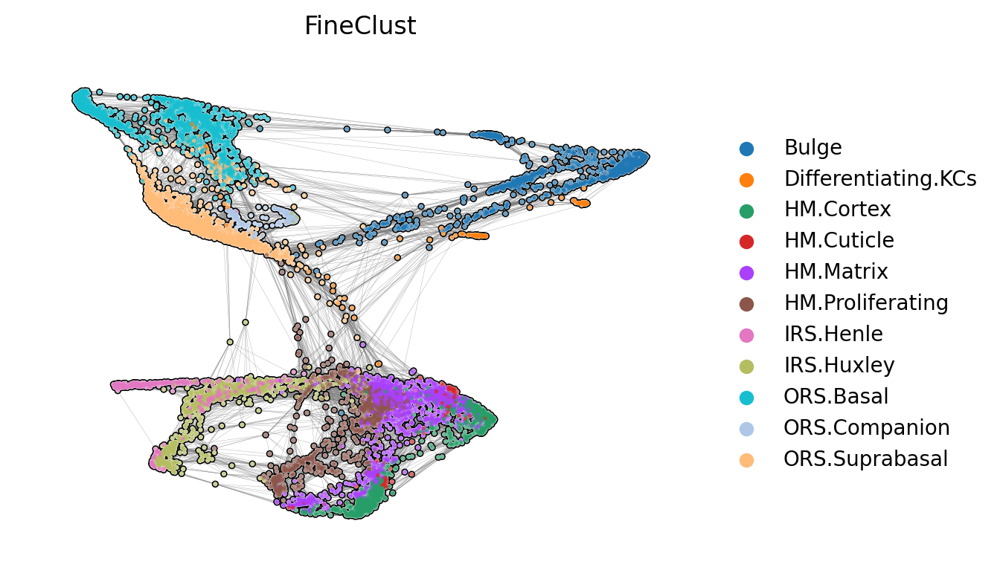

In [10]:
sc.pl.draw_graph(adata_combined, color = "FineClust", edges = True, frameon = False, add_outline = True)

In [11]:
adata.write(os.path.join(input_dir, "Shim22_Greenleaf_GRN_Subset_Filter.h5ad"))
#adata = sc.read_h5ad("/mnt/c/users/Uvictor/documents/scRNA_output/Shim_2022/Shim22_Subset_Filter.h5ad")

In [18]:
oracle = co.Oracle()

In [19]:
oracle.import_anndata_as_raw_count(adata=adata_combined,
                                   cluster_column_name="FineClust",
                                   embedding_name="X_draw_graph_fa")

In [20]:
oracle.import_TF_data(TF_info_matrix= baseGRN)

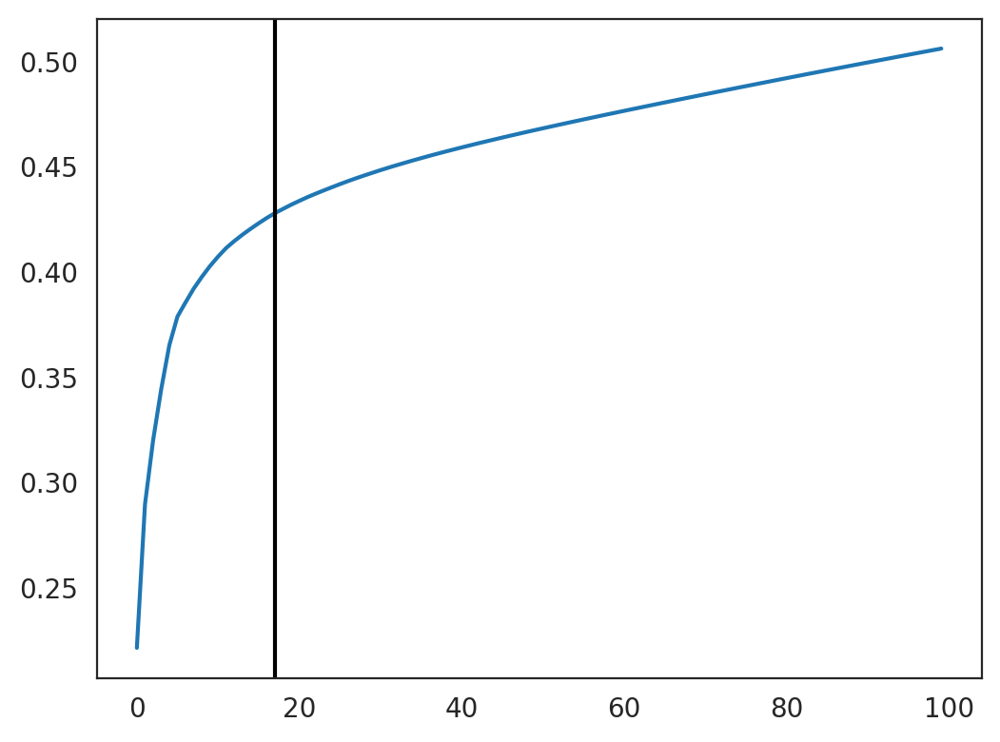

17


In [21]:
# Perform PCA
oracle.perform_PCA()

# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

In [22]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :7550


In [23]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

Auto-selected k is :188


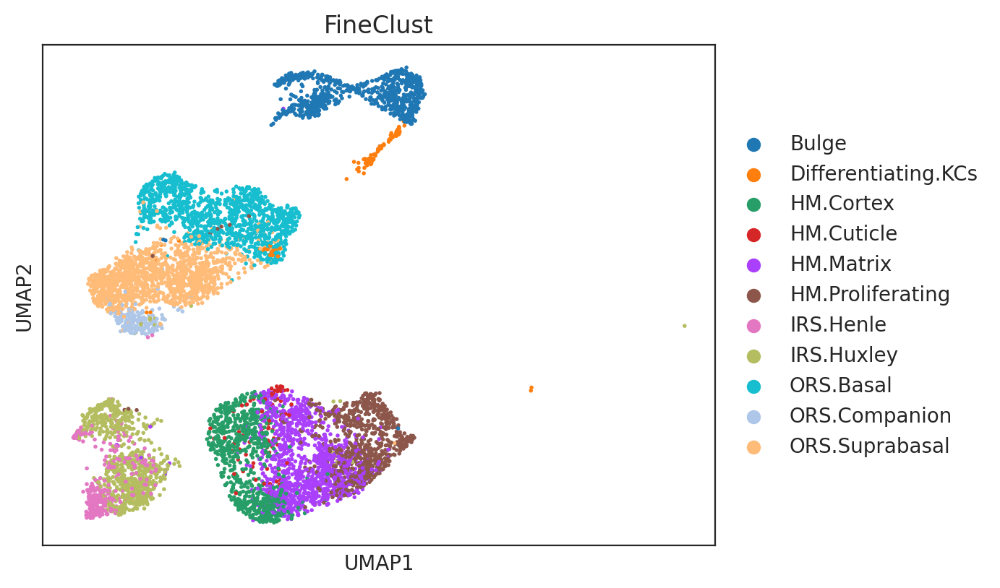

In [24]:
clustering = "FineClust"
clustering in adata.obs.columns

sc.pl.umap(adata, color=clustering)

In [25]:
oracle

Oracle object

Meta data
    celloracle version used for instantiation: 0.18.0
    n_cells: 7550
    n_genes: 3011
    cluster_name: FineClust
    dimensional_reduction_name: X_draw_graph_fa
    n_target_genes_in_TFdict: 20169 genes
    n_regulatory_in_TFdict: 1094 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 129 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 2664 genes
    k_for_knn_imputation: NA
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn imputation: Not finished
    GRN calculation for simulation: Not finished

In [26]:
print("n_pca_dims:", type(n_comps), n_comps)
print("k:", type(k), k)
print("b_sight:", type(k*8), k*8)
print("b_maxl:", type(k*4), k*4)

n_comps_int = int(n_comps)

oracle.knn_imputation(n_pca_dims= 26, k= 553, b_sight=k*8, b_maxl=k*4, n_jobs=4)

n_pca_dims: <class 'numpy.int64'> 17
k: <class 'int'> 188
b_sight: <class 'int'> 1504
b_maxl: <class 'int'> 752


In [27]:
oracle.to_hdf5("Shim22_Greenleaf23_GRN_Filtered.celloracle.oracle")

In [28]:
links = oracle.get_links(cluster_name_for_GRN_unit="FineClust", alpha=10,
                         verbose_level=10, test_mode=False, n_jobs=-1)

  0%|          | 0/11 [00:00<?, ?it/s]

Inferring GRN for Bulge...


  0%|          | 0/2664 [00:00<?, ?it/s]

Inferring GRN for Differentiating.KCs...


  0%|          | 0/2664 [00:00<?, ?it/s]

Inferring GRN for HM.Cortex...


  0%|          | 0/2664 [00:00<?, ?it/s]

Inferring GRN for HM.Cuticle...


  0%|          | 0/2664 [00:00<?, ?it/s]

Inferring GRN for HM.Matrix...


  0%|          | 0/2664 [00:00<?, ?it/s]

Inferring GRN for HM.Proliferating...


  0%|          | 0/2664 [00:00<?, ?it/s]

Inferring GRN for IRS.Henle...


  0%|          | 0/2664 [00:00<?, ?it/s]

Inferring GRN for IRS.Huxley...


  0%|          | 0/2664 [00:00<?, ?it/s]

Inferring GRN for ORS.Basal...


  0%|          | 0/2664 [00:00<?, ?it/s]

Inferring GRN for ORS.Companion...


  0%|          | 0/2664 [00:00<?, ?it/s]

Inferring GRN for ORS.Suprabasal...


  0%|          | 0/2664 [00:00<?, ?it/s]

In [29]:
links.links_dict.keys()

dict_keys(['Bulge', 'Differentiating.KCs', 'HM.Cortex', 'HM.Cuticle', 'HM.Matrix', 'HM.Proliferating', 'IRS.Henle', 'IRS.Huxley', 'ORS.Basal', 'ORS.Companion', 'ORS.Suprabasal'])

In [30]:
for cluster in links.links_dict.keys():
    # Save each cluster's GRN as a CSV file
    file_name = f"raw_GRN_for_{cluster}.csv"
    links.links_dict[cluster].to_csv(file_name)
    print(f"Saved GRN for {cluster} to {file_name}")

Saved GRN for Bulge to raw_GRN_for_Bulge.csv
Saved GRN for Differentiating.KCs to raw_GRN_for_Differentiating.KCs.csv
Saved GRN for HM.Cortex to raw_GRN_for_HM.Cortex.csv
Saved GRN for HM.Cuticle to raw_GRN_for_HM.Cuticle.csv
Saved GRN for HM.Matrix to raw_GRN_for_HM.Matrix.csv
Saved GRN for HM.Proliferating to raw_GRN_for_HM.Proliferating.csv
Saved GRN for IRS.Henle to raw_GRN_for_IRS.Henle.csv
Saved GRN for IRS.Huxley to raw_GRN_for_IRS.Huxley.csv
Saved GRN for ORS.Basal to raw_GRN_for_ORS.Basal.csv
Saved GRN for ORS.Companion to raw_GRN_for_ORS.Companion.csv
Saved GRN for ORS.Suprabasal to raw_GRN_for_ORS.Suprabasal.csv


In [31]:
links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)

In [32]:
plt.rcParams["figure.figsize"] = [9, 4.5]

Bulge


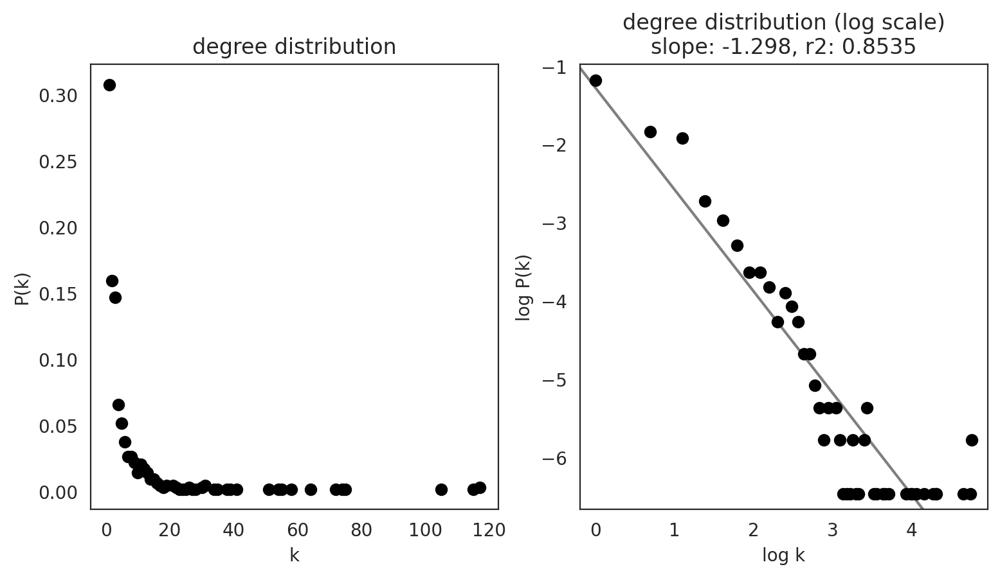

Differentiating.KCs


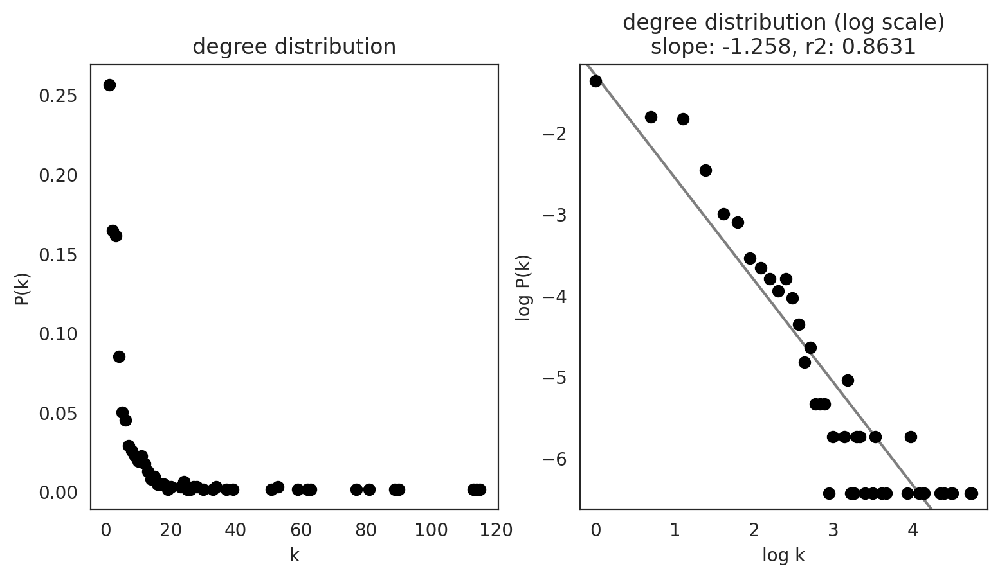

HM.Cortex


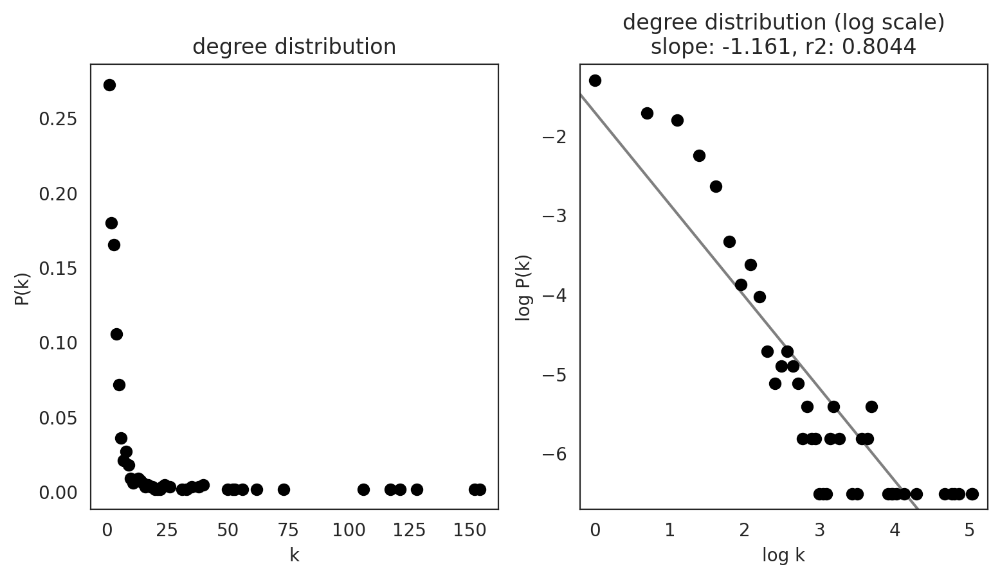

HM.Cuticle


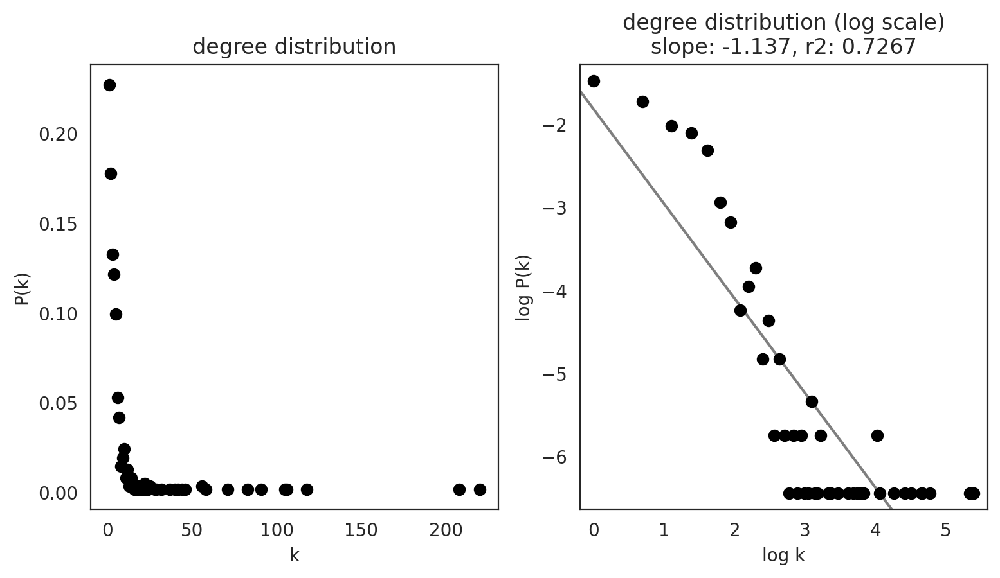

HM.Matrix


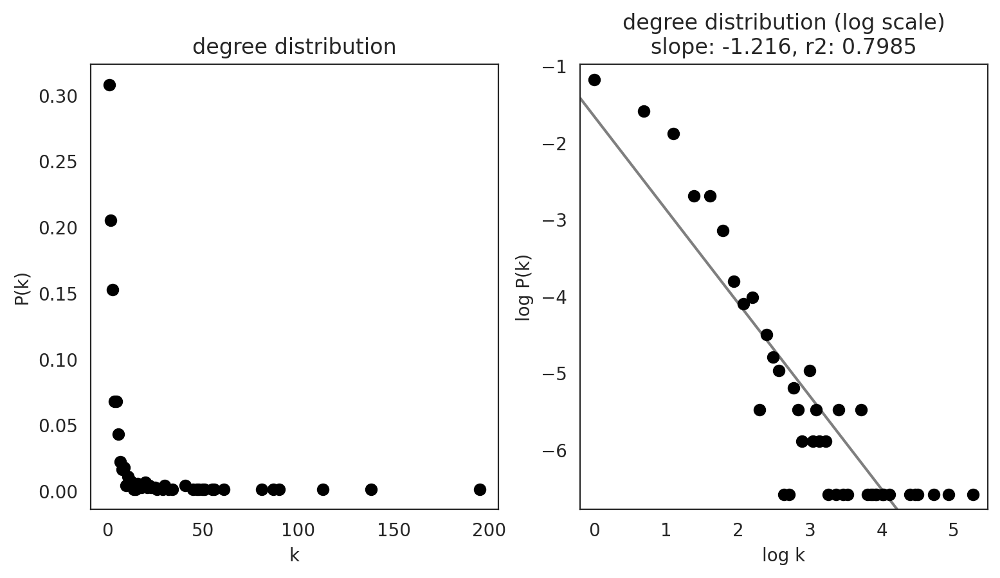

HM.Proliferating


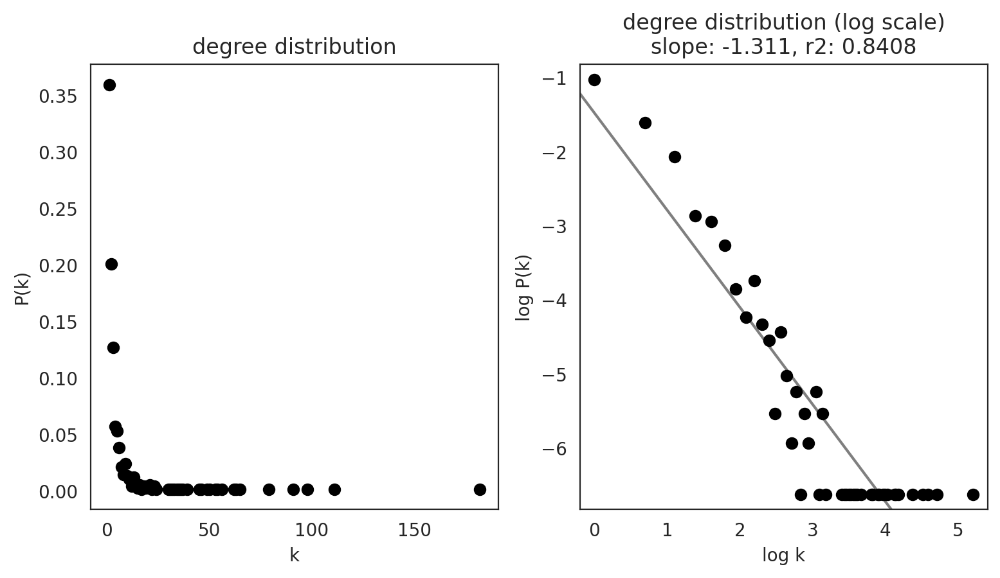

IRS.Henle


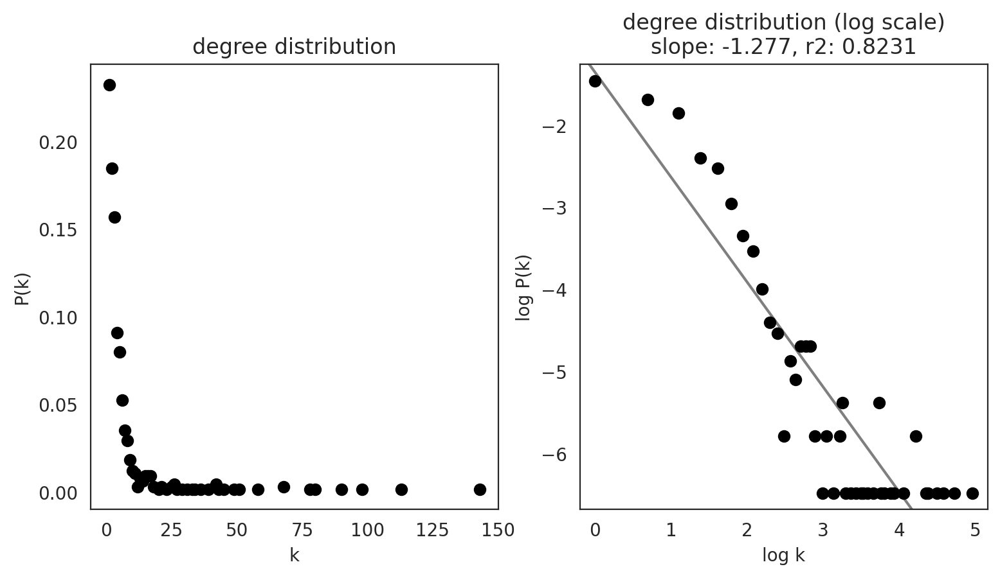

IRS.Huxley


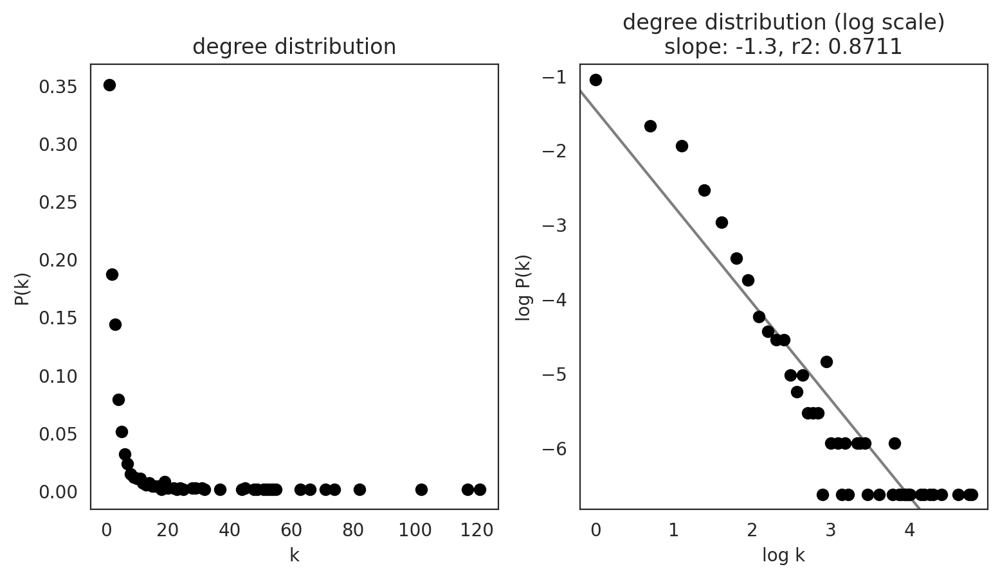

ORS.Basal


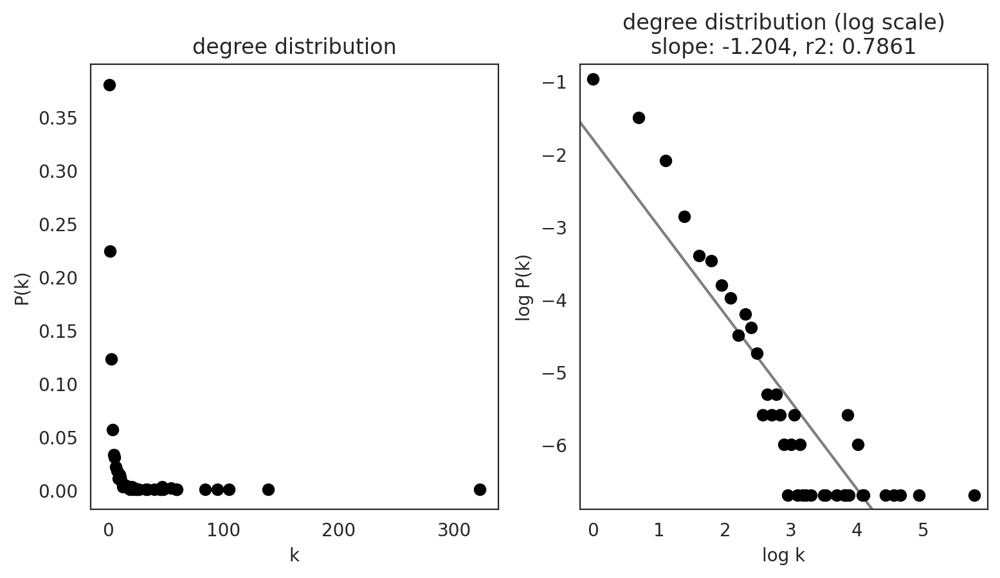

ORS.Companion


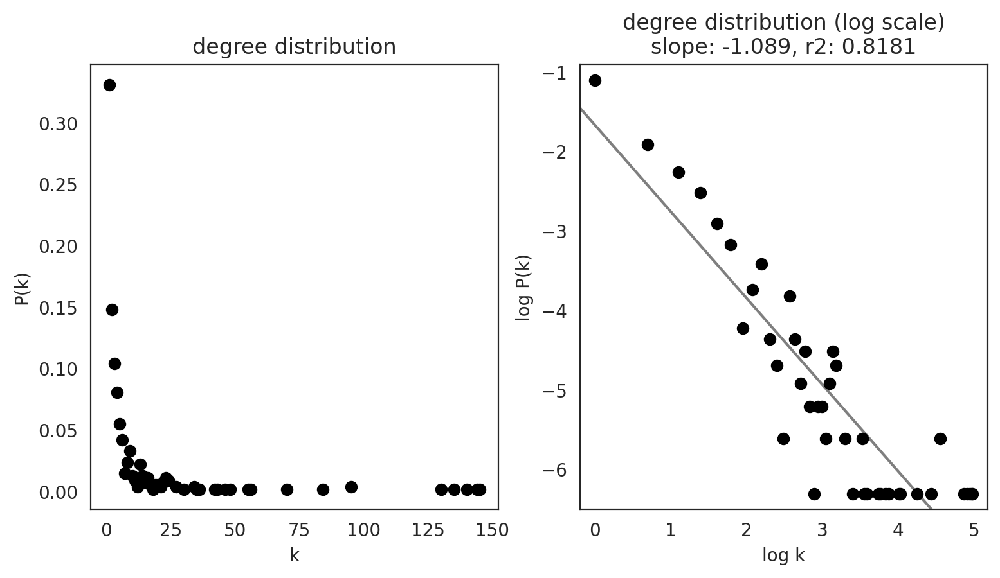

ORS.Suprabasal


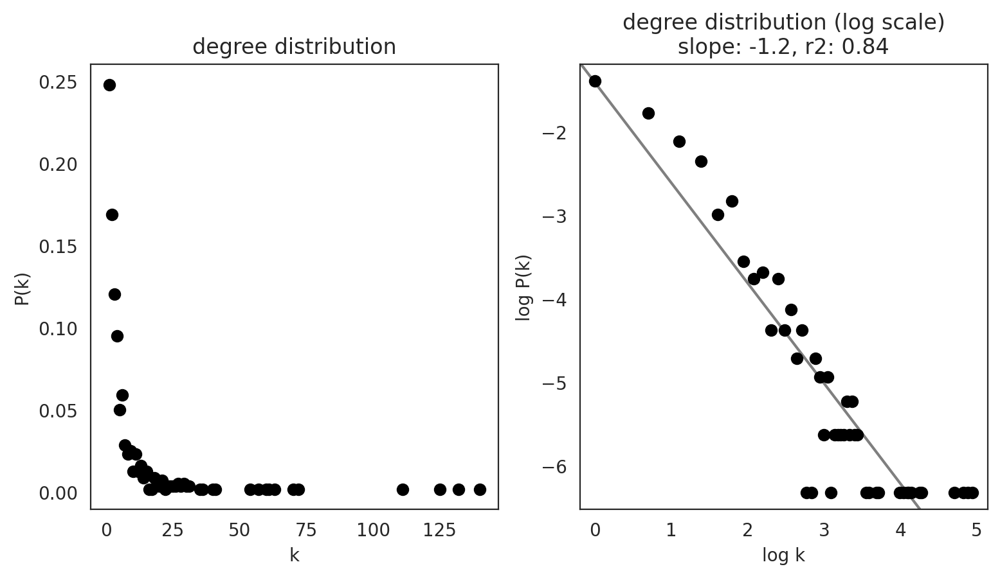

In [33]:
links.plot_degree_distributions(plot_model=True, 
                                               save=f"{save_folder}/degree_distribution/",
                                               )

In [34]:
links.get_network_score()

In [35]:
links.merged_score.head()



,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
TCF7L2,117,0.183099,3,0.004695,114,0.178404,287.0,1.000000,Bulge
KRT14,8,0.012520,8,0.012520,0,0.000000,0.0,0.455414,Bulge
BRCA1,13,0.020344,0,0.000000,13,0.020344,0.0,0.160093,Bulge
CDH13,3,0.004695,3,0.004695,0,0.000000,0.0,0.071393,Bulge
STAT1,26,0.040689,0,0.000000,26,0.040689,0.0,0.365764,Bulge


In [36]:
links.to_hdf5(file_path="GreenleafGRN_links.celloracle.links")

In [37]:
links.cluster

['Bulge',
 'Differentiating.KCs',
 'HM.Cortex',
 'HM.Cuticle',
 'HM.Matrix',
 'HM.Proliferating',
 'IRS.Henle',
 'IRS.Huxley',
 'ORS.Basal',
 'ORS.Companion',
 'ORS.Suprabasal']

In [38]:
for cluster in links.links_dict.keys():
    # Save each cluster's GRN as a CSV file
    file_name = f"raw_GreenleafGRN_for_{cluster}.csv"
    links.links_dict[cluster].to_csv(file_name)
    print(f"Saved GRN for {cluster} to {file_name}")

Saved GRN for Bulge to raw_GreenleafGRN_for_Bulge.csv
Saved GRN for Differentiating.KCs to raw_GreenleafGRN_for_Differentiating.KCs.csv
Saved GRN for HM.Cortex to raw_GreenleafGRN_for_HM.Cortex.csv
Saved GRN for HM.Cuticle to raw_GreenleafGRN_for_HM.Cuticle.csv
Saved GRN for HM.Matrix to raw_GreenleafGRN_for_HM.Matrix.csv
Saved GRN for HM.Proliferating to raw_GreenleafGRN_for_HM.Proliferating.csv
Saved GRN for IRS.Henle to raw_GreenleafGRN_for_IRS.Henle.csv
Saved GRN for IRS.Huxley to raw_GreenleafGRN_for_IRS.Huxley.csv
Saved GRN for ORS.Basal to raw_GreenleafGRN_for_ORS.Basal.csv
Saved GRN for ORS.Companion to raw_GreenleafGRN_for_ORS.Companion.csv
Saved GRN for ORS.Suprabasal to raw_GreenleafGRN_for_ORS.Suprabasal.csv


In [127]:
# plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
# links.plot_score_comparison_2D(value="eigenvector_centrality",
#                                cluster1="Bulge", cluster2="Bulge", 
#                                percentile=98, save=f"{save_folder}/score_comparison_Bulge_Bulge.C1")

# plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
# links.plot_score_comparison_2D(value="eigenvector_centrality",
#                                cluster1="Bulge", cluster2="Bulge.C2", 
#                                percentile=98, save=f"{save_folder}/score_comparison_Bulge_Bulge.C2")

# plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
# links.plot_score_comparison_2D(value="eigenvector_centrality",
#                                cluster1="Bulge", cluster2="Bulge.T1", 
#                                percentile=98, save=f"{save_folder}/score_comparison_Bulge_Bulge.T1")

# plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
# links.plot_score_comparison_2D(value="eigenvector_centrality",
#                                cluster1="Bulge", cluster2="Bulge.T2", 
#                                percentile=98, save=f"{save_folder}/score_comparison_Bulge_Bulge.T2")

In [128]:
# plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
# links.plot_score_comparison_2D(value="betweenness_centrality",
#                                cluster1="Bulge", cluster2="Bulge.C1", 
#                                percentile=98, save=f"{save_folder}/score_comparison_Bulge_Bulge.C1")

# plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
# links.plot_score_comparison_2D(value="betweenness_centrality",
#                                cluster1="Bulge", cluster2="Bulge.C2", 
#                                percentile=98, save=f"{save_folder}/score_comparison_Bulge_Bulge.C2")

# plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
# links.plot_score_comparison_2D(value="betweenness_centrality",
#                                cluster1="Bulge", cluster2="Bulge.T1", 
#                                percentile=98, save=f"{save_folder}/score_comparison_Bulge_Bulge.T1")

# plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
# links.plot_score_comparison_2D(value="betweenness_centrality",
#                                cluster1="Bulge", cluster2="Bulge.T2", 
#                                percentile=98, save=f"{save_folder}/score_comparison_Bulge_Bulge.T2")

TNFSF12


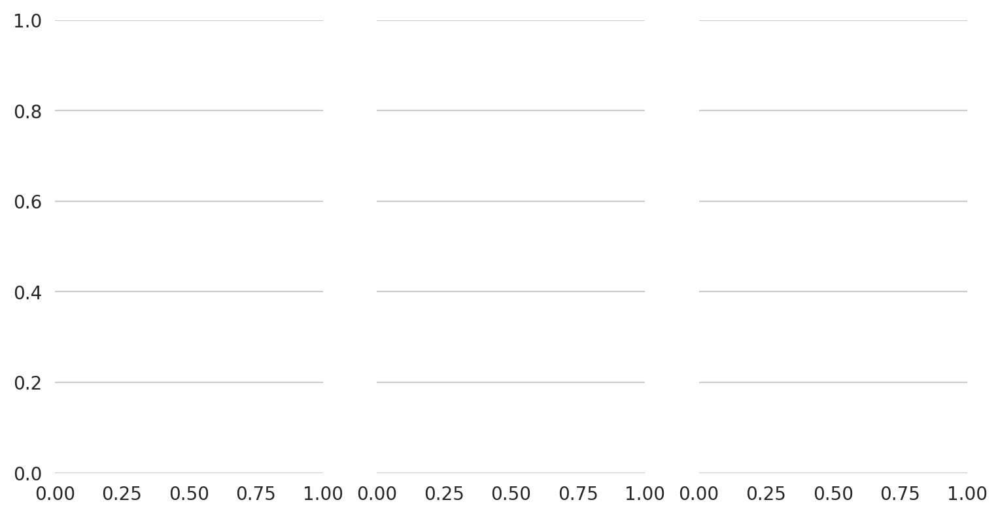

Saved network score plot for TNFSF12 to /mnt/c/users/uvictor/documents/CellOracle/Shim22_GreenleafGRN/GreenleafGRN_network_score_per_gene/TNFSF12_network_score.png
FN14


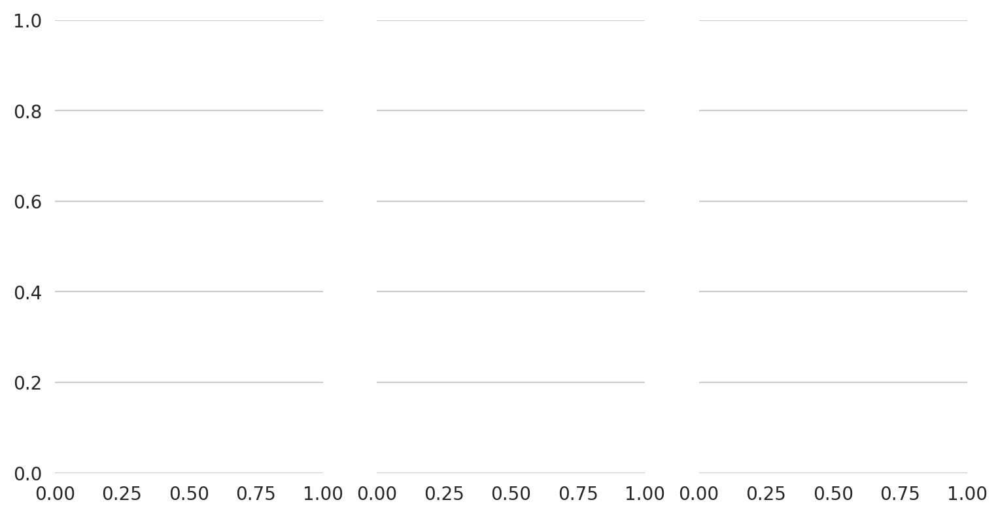

Saved network score plot for FN14 to /mnt/c/users/uvictor/documents/CellOracle/Shim22_GreenleafGRN/GreenleafGRN_network_score_per_gene/FN14_network_score.png
TNFRSF12A


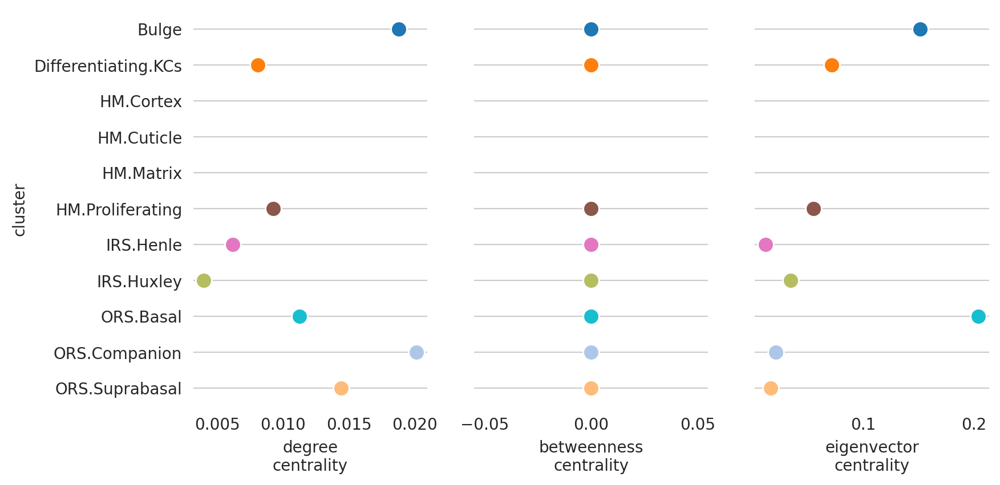

Saved network score plot for TNFRSF12A to /mnt/c/users/uvictor/documents/CellOracle/Shim22_GreenleafGRN/GreenleafGRN_network_score_per_gene/TNFRSF12A_network_score.png
TWEAK


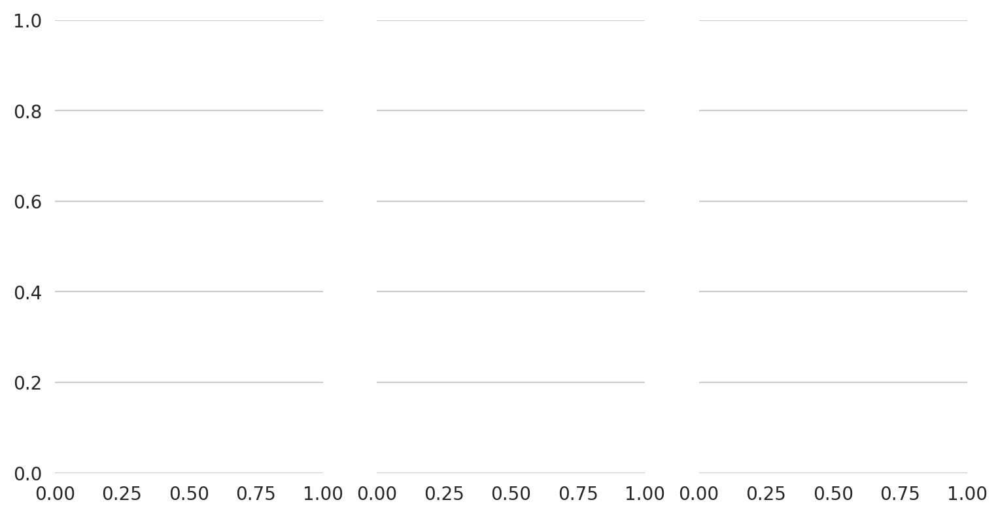

Saved network score plot for TWEAK to /mnt/c/users/uvictor/documents/CellOracle/Shim22_GreenleafGRN/GreenleafGRN_network_score_per_gene/TWEAK_network_score.png
FGF5


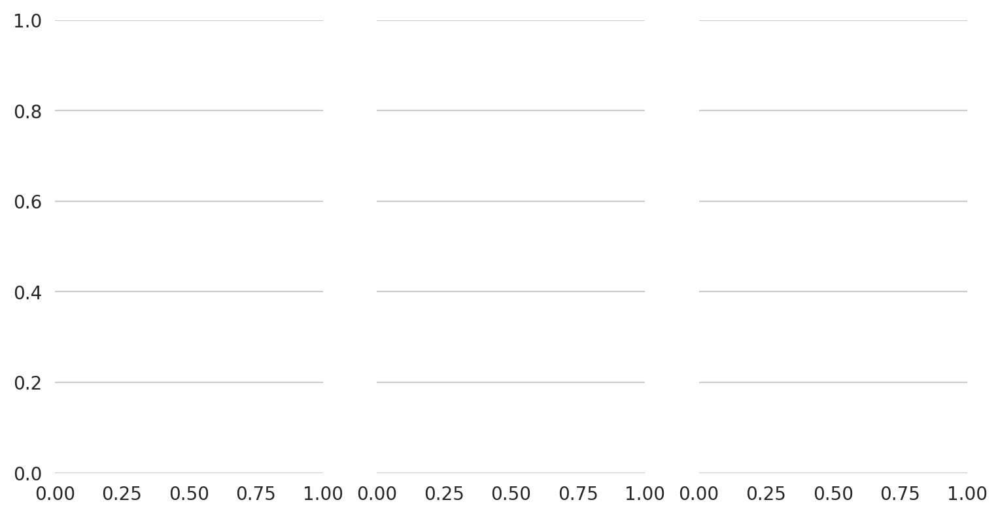

Saved network score plot for FGF5 to /mnt/c/users/uvictor/documents/CellOracle/Shim22_GreenleafGRN/GreenleafGRN_network_score_per_gene/FGF5_network_score.png
FGF7


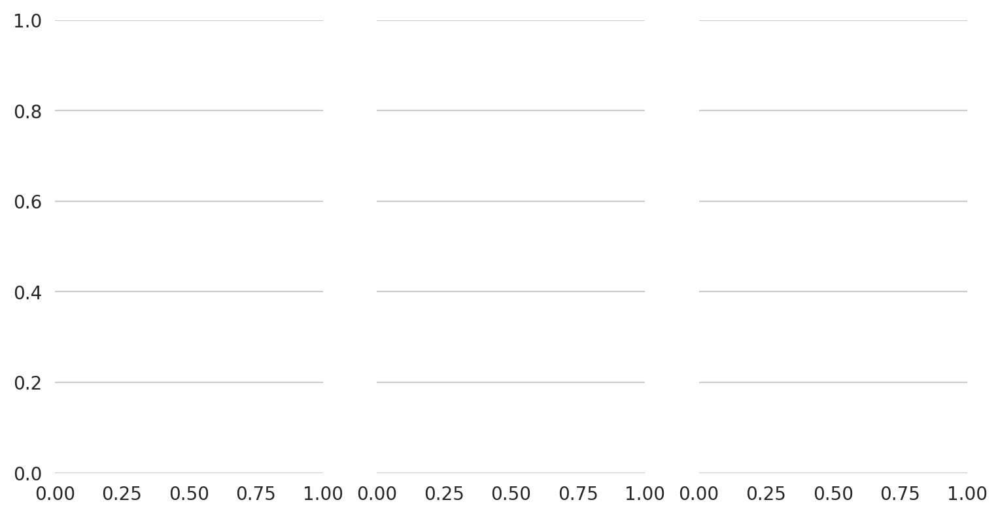

Saved network score plot for FGF7 to /mnt/c/users/uvictor/documents/CellOracle/Shim22_GreenleafGRN/GreenleafGRN_network_score_per_gene/FGF7_network_score.png
FGF14


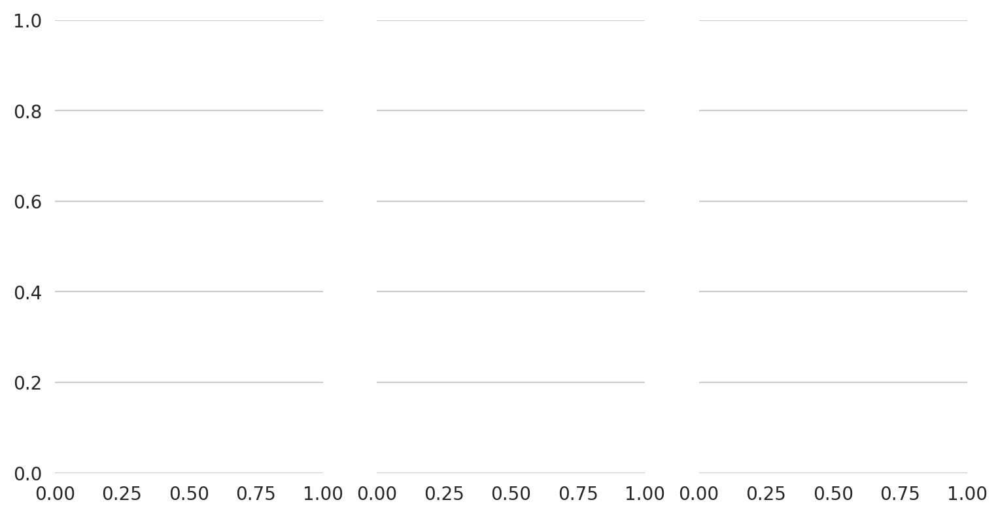

Saved network score plot for FGF14 to /mnt/c/users/uvictor/documents/CellOracle/Shim22_GreenleafGRN/GreenleafGRN_network_score_per_gene/FGF14_network_score.png
STAT4


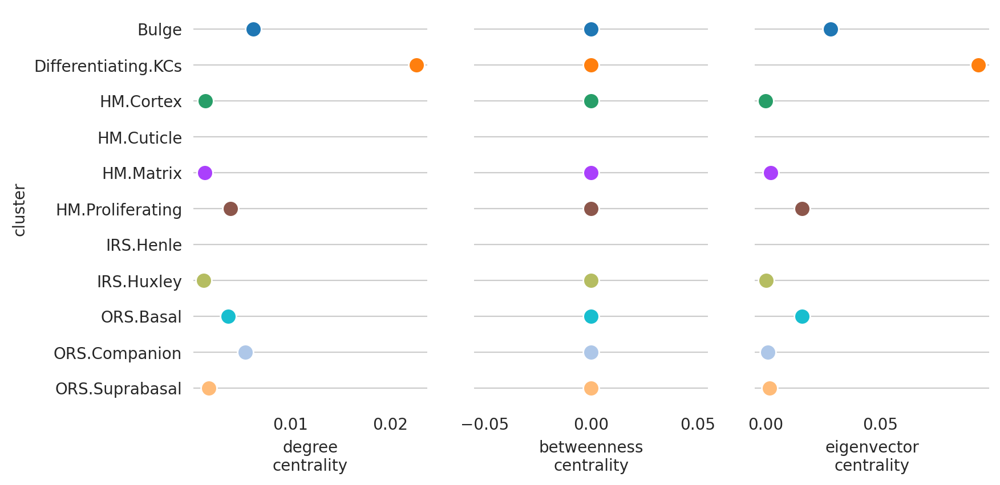

Saved network score plot for STAT4 to /mnt/c/users/uvictor/documents/CellOracle/Shim22_GreenleafGRN/GreenleafGRN_network_score_per_gene/STAT4_network_score.png


In [39]:
gene_list = ["TNFSF12", "FN14", "TNFRSF12A", "TWEAK", "FGF5", "FGF7", "FGF14", "STAT4"]

for gene in gene_list:
    # Set the save path for the current gene's network score plot
    save_path = f"{save_folder}/GreenleafGRN_network_score_per_gene/{gene}_network_score.png"
    
    # Plot and save the network score for the current gene
    links.plot_score_per_cluster(goi=gene, save=save_path)
    
    print(f"Saved network score plot for {gene} to {save_path}")

degree_centrality_all


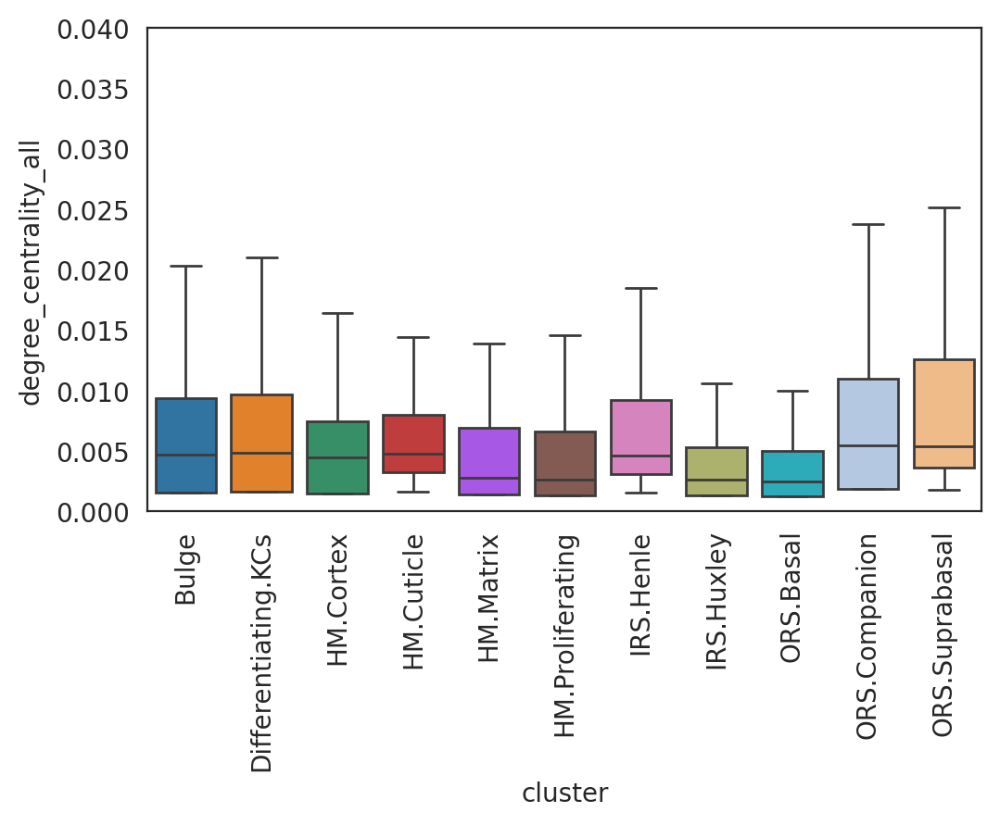

In [40]:
plt.rcParams["figure.figsize"] = [6, 4.5]

# Plot degree_centrality
plt.subplots_adjust(left=0.15, bottom=0.3)
plt.ylim([0,0.040])
links.plot_score_discributions(values=["degree_centrality_all"],
                               method="boxplot",
                               save=f"{save_folder}",
                              )

eigenvector_centrality


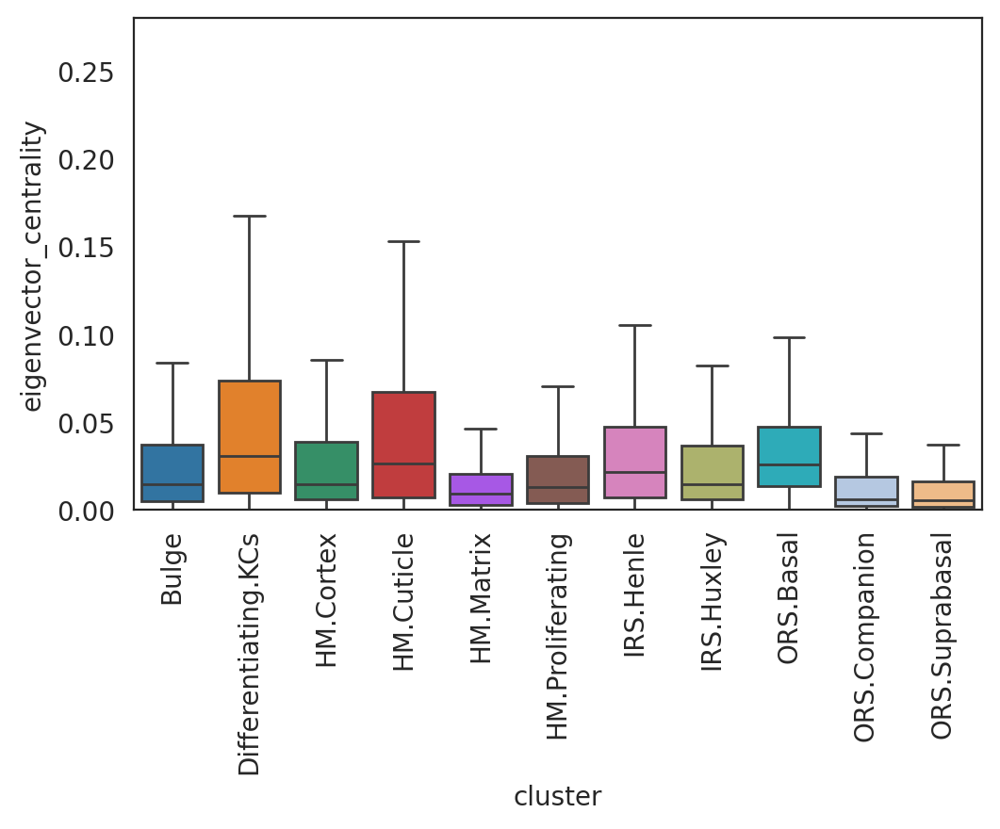

In [41]:
# Plot eigenvector_centrality
plt.subplots_adjust(left=0.15, bottom=0.3)
plt.ylim([0, 0.28])
links.plot_score_discributions(values=["eigenvector_centrality"],
                               method="boxplot",
                               save=f"{save_folder}")

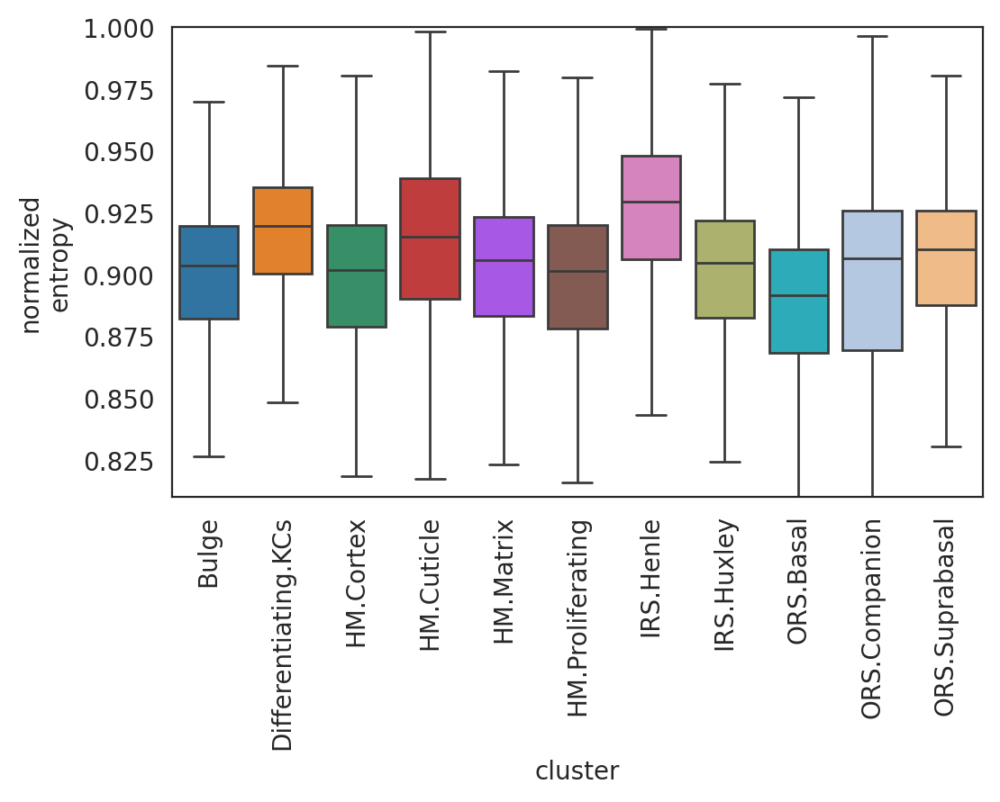

In [42]:
plt.subplots_adjust(left=0.15, bottom=0.3)
links.plot_network_entropy_distributions(save=f"{save_folder}")

In [43]:
oracle.to_hdf5("/mnt/c/users/UVictor/Documents/CellOracle/Shim22_GreenleafGRN_data.celloracle.oracle")
links.to_hdf5(file_path="/mnt/c/users/UVictor/Documents/CellOracle/Shim22_GreenleafGRN.celloracle.links")


In [44]:
oracle = co.load_hdf5("/mnt/c/users/UVictor/Documents/CellOracle/Shim22_GreenleafGRN_data.celloracle.oracle")
links = co.load_hdf5(file_path="/mnt/c/users/UVictor/Documents/CellOracle/Shim22_GreenleafGRN.celloracle.links")

In [45]:
oracle

Oracle object

Meta data
    celloracle version used for instantiation: 0.18.0
    n_cells: 7550
    n_genes: 3011
    cluster_name: FineClust
    dimensional_reduction_name: X_draw_graph_fa
    n_target_genes_in_TFdict: 20169 genes
    n_regulatory_in_TFdict: 1094 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 129 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 2664 genes
    k_for_knn_imputation: 553
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn imputation: Done
    GRN calculation for simulation: Not finished

In [46]:
pt = Pseudotime_calculator(oracle_object=oracle)

In [115]:
#adata = sc.read_h5ad("/mnt/c/users/Uvict/documents/Ubels2024_Subset_Filter.h5ad")

# specific_cluster_id = 'Bulge.C2'
# print("Unique clusters in FineClust:", adata.obs['FineClust'].unique())

# num_specific = (adata.obs['FineClust'] == specific_cluster_id).sum()
# print(f"Number of cells in '{specific_cluster_id}' cluster: {num_specific}")

# # Filter adata for the specific cluster
# adata_specific = adata[adata.obs['FineClust'] == specific_cluster_id]

# # Check the shape of the filtered AnnData object
# print("Shape of filtered adata_specific:", adata_specific.shape)

# # Check if there are observations in the specific cluster
# if adata_specific.n_obs > 0:
#     plt.scatter(adata_specific.obsm['X_draw_graph_fa'][:, 0], adata_specific.obsm['X_draw_graph_fa'][:, 1])
#     plt.title(f'Specific Cluster: {specific_cluster_id}')
#     plt.xlabel('Component 1')
#     plt.ylabel('Component 2')
#     plt.grid()
#     plt.show()
# else:
#     print(f"No data for {specific_cluster_id}")

# if 'X_draw_graph_fa' in adata.obsm:
#     print("X_draw_graph_fa is present in the original adata.")
# else:
#     print("X_draw_graph_fa is not present in the original adata.")

# adata_specific.obsm['X_draw_graph_fa'] = adata.obsm['X_draw_graph_fa'][adata.obs['FineClust'] == specific_cluster_id]

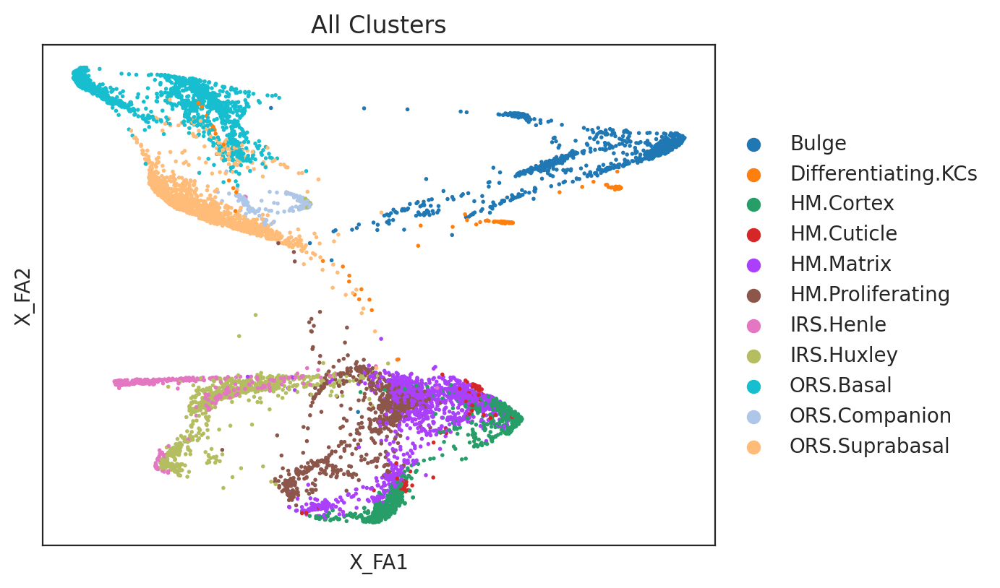

In [47]:
#specific_cluster_id = 'Bulge'  # Replace with your specific cluster ID

# Plot all clusters on the first subplot
sc.pl.embedding(adata_combined, basis='X_draw_graph_fa', color='FineClust', title='All Clusters')


# Filter adata for the specific cluster
#adata_specific = adata[adata.obs['FineClust'] == specific_cluster_id]
#print(adata_specific)

#sc.pl.embedding(adata_specific, basis='X_draw_graph_fa', color='FineClust', title='Specific Clusters')

In [48]:
clusters_in_ORS_lineage = ['Bulge', 'ORS.Basal', 'ORS.Suprabasal', 'ORS.Companion', 'Differentiating.KCs']
clusters_in_IRS_lineage = ['Bulge', 'Differentiating.KCs', 'IRS.Henle', 'IRS.Huxley', 'HM.Proliferating']
clusters_in_MX_lineage = ['Bulge', 'HM.Cortex', 'HM.Matrix', 'HM.Proliferating', 'HM.Cuticle', 'Differentiating.KCs']

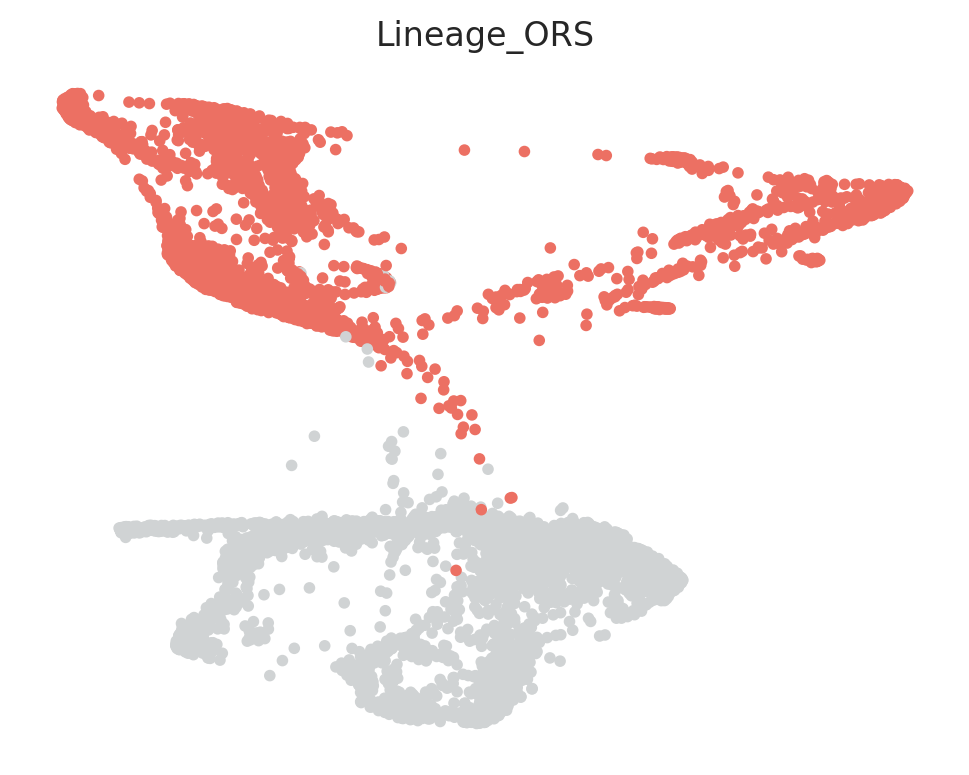

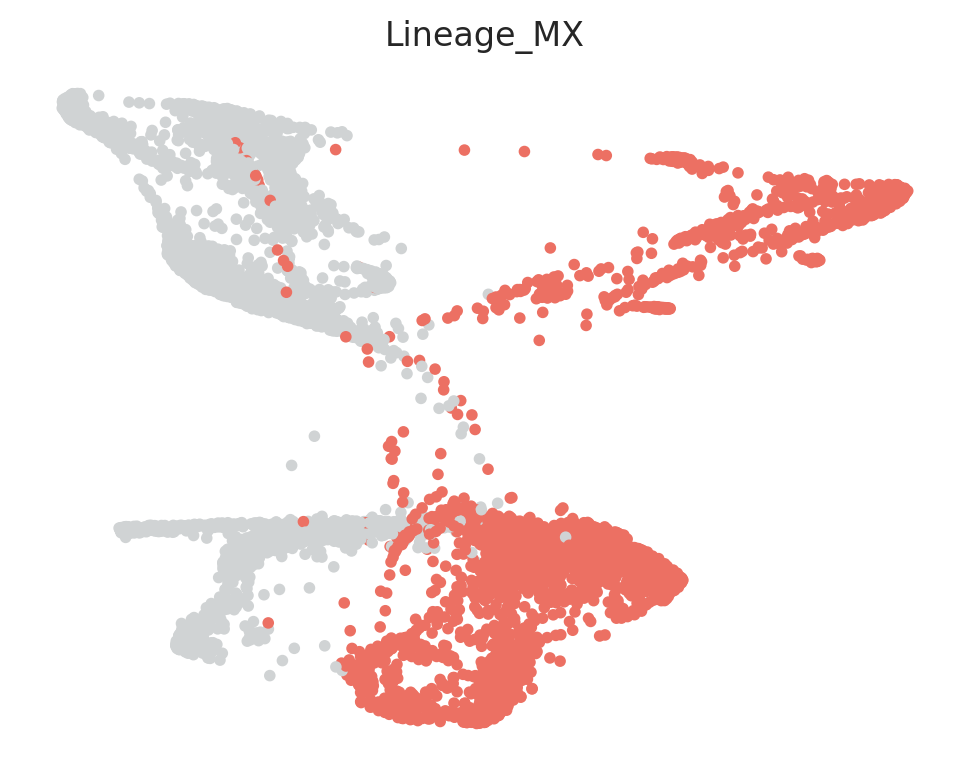

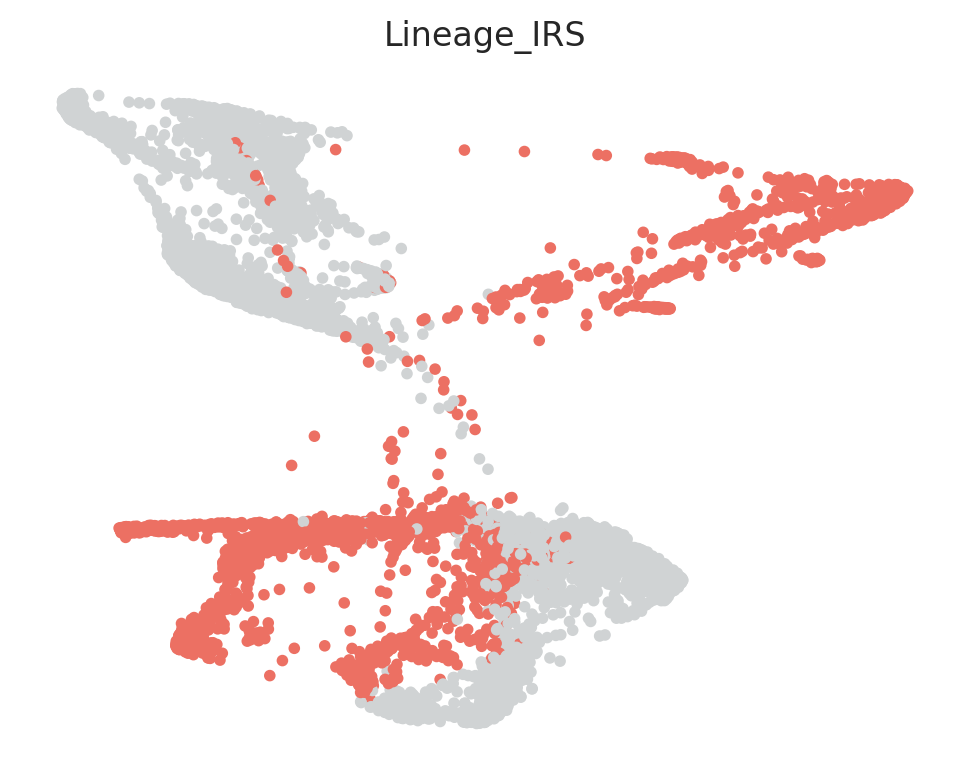

In [49]:
# Make a dictionary
lineage_dictionary = {"Lineage_ORS": clusters_in_ORS_lineage,
                      "Lineage_MX": clusters_in_MX_lineage,
                      "Lineage_IRS": clusters_in_IRS_lineage
                     }

# Input lineage information into pseudotime object
pt.set_lineage(lineage_dictionary=lineage_dictionary)

# Visualize lineage information
pt.plot_lineages()

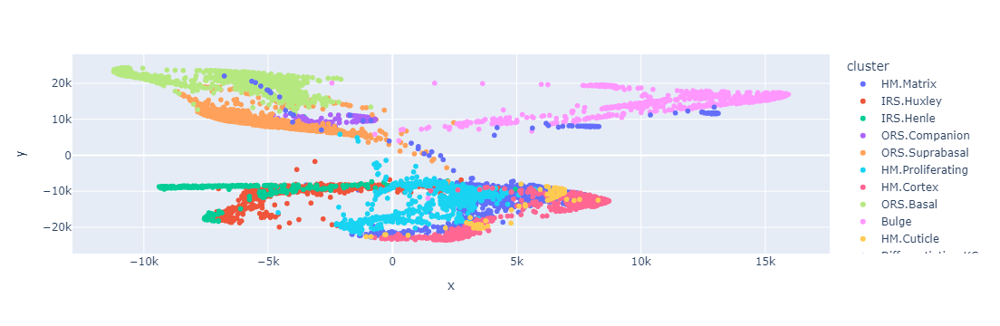

In [45]:
# Show interactive plot using plotly. Please make sure that plotly is installed.

try:
    import plotly.express as px
    def plot(adata, embedding_key, cluster_column_name):
        embedding = adata.obsm[embedding_key]
        df = pd.DataFrame(embedding, columns=["x", "y"])
        df["cluster"] = adata.obs[cluster_column_name].values
        df["label"] = adata.obs.index.values
        fig = px.scatter(df, x="x", y="y", hover_name=df["label"], color="cluster")
        fig.show()

    plot(adata=pt.adata,
         embedding_key=pt.obsm_key,
         cluster_column_name=pt.cluster_column_name)
except:
    print("Plotly not found in your environment. Did you install plotly? Please read the instruction above.")

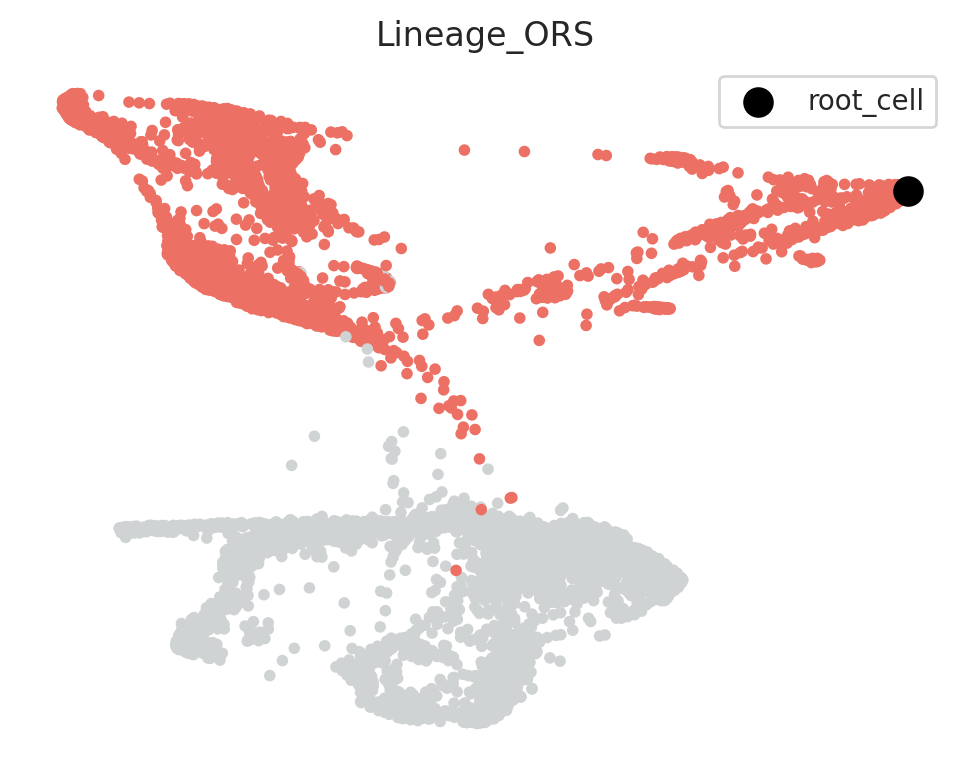

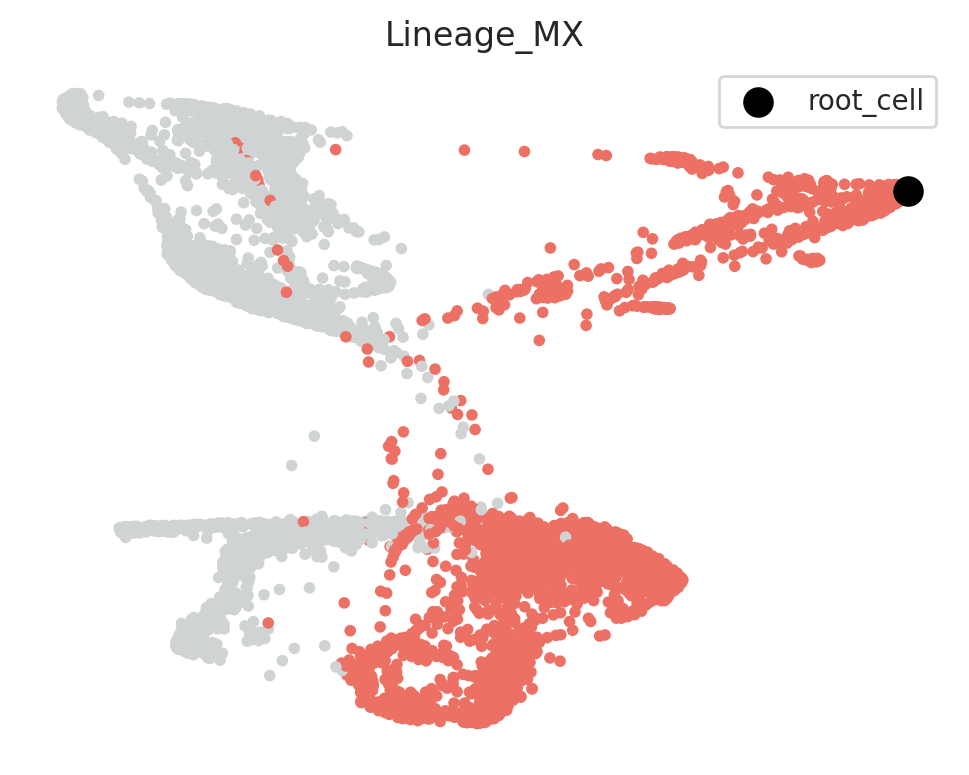

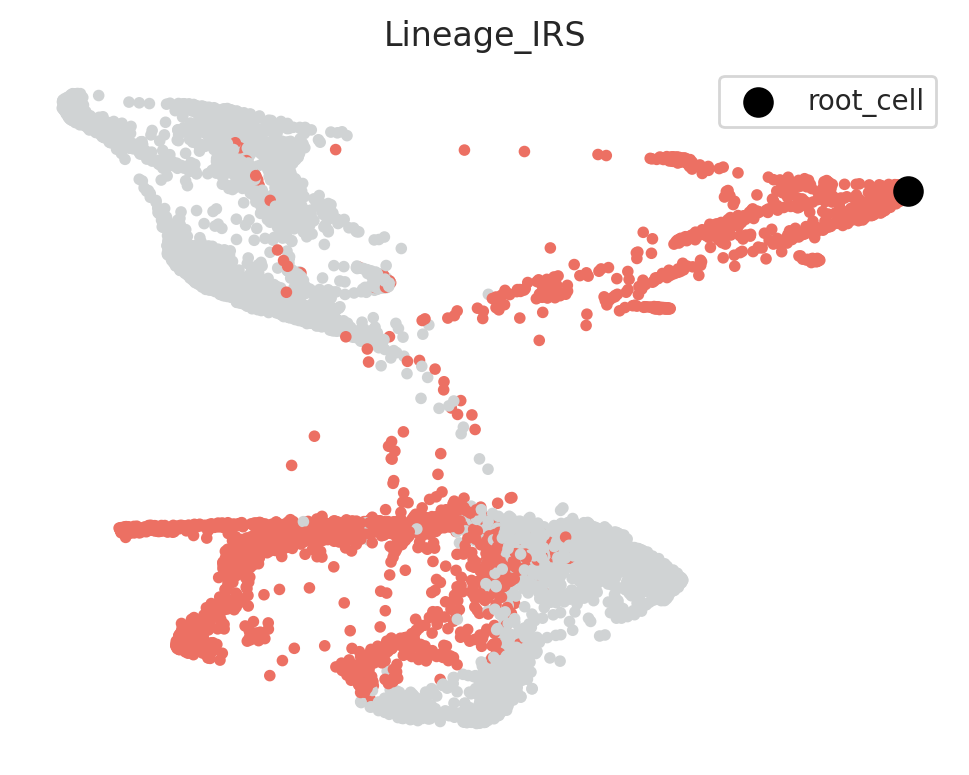

In [50]:
root_cells = {"Lineage_ORS": "CTAACTTCATAGGAGC-1_2", "Lineage_MX": "CTAACTTCATAGGAGC-1_2", "Lineage_IRS": "CTAACTTCATAGGAGC-1_2"}

pt.set_root_cells(root_cells=root_cells)
pt.plot_root_cells()

In [51]:
sc.pp.neighbors(pt.adata, n_neighbors=30)
sc.tl.diffmap(pt.adata)

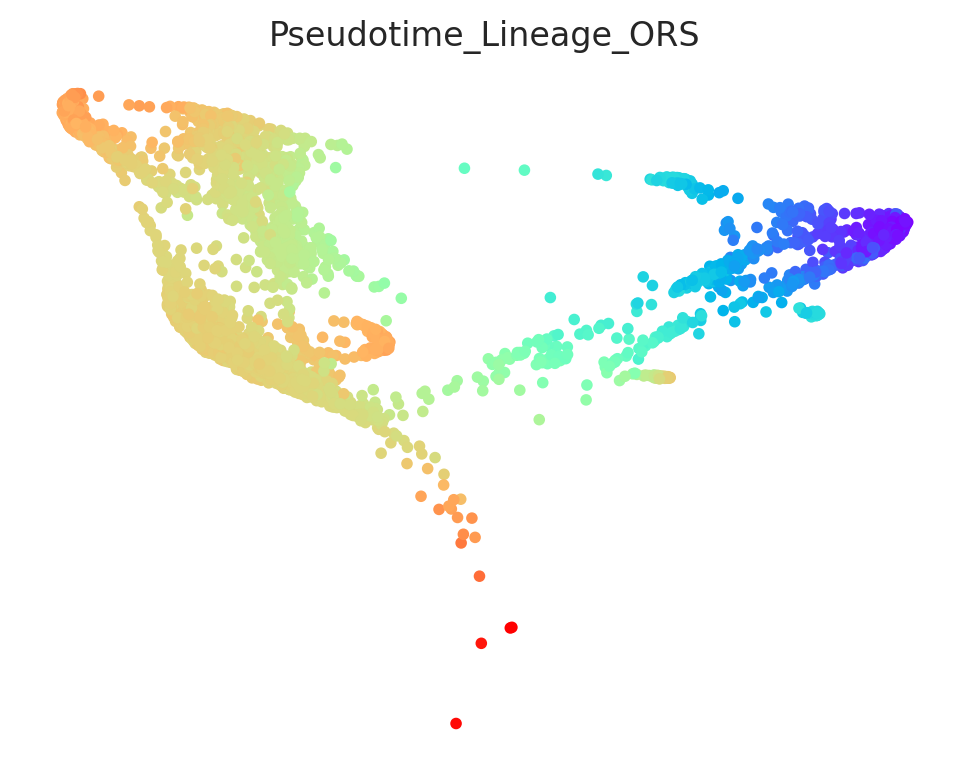

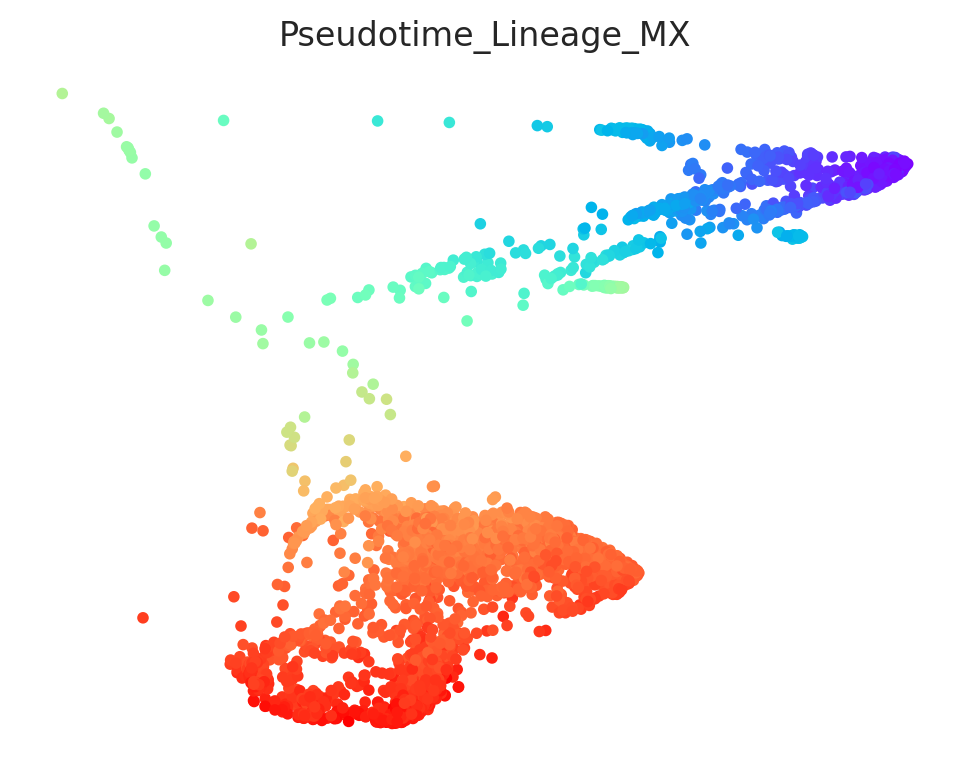

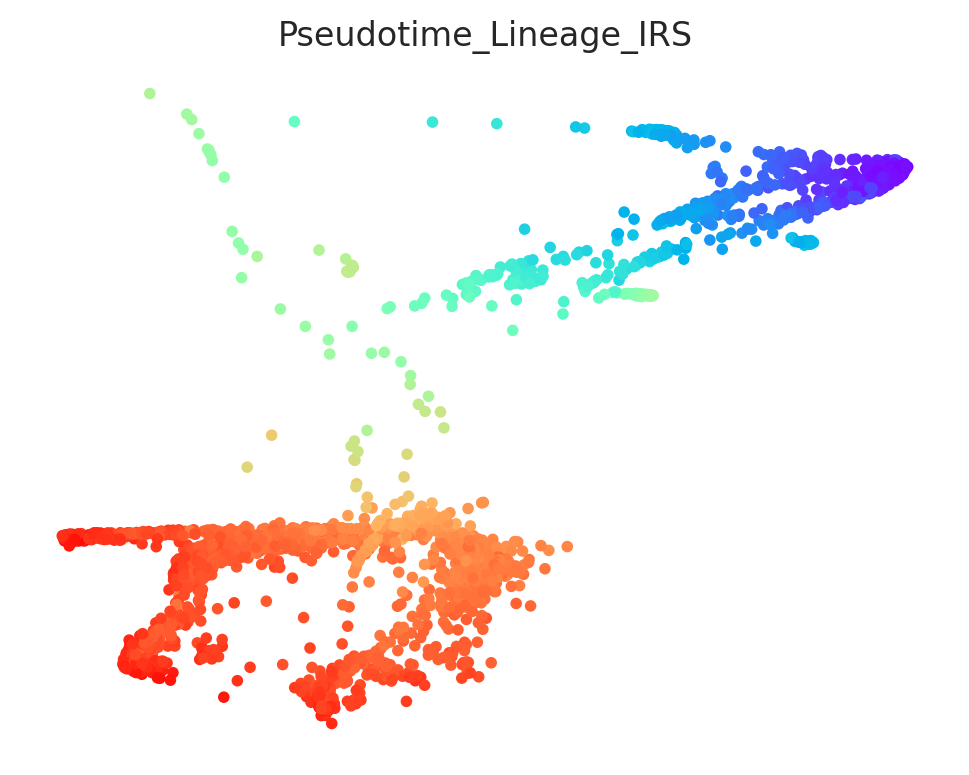

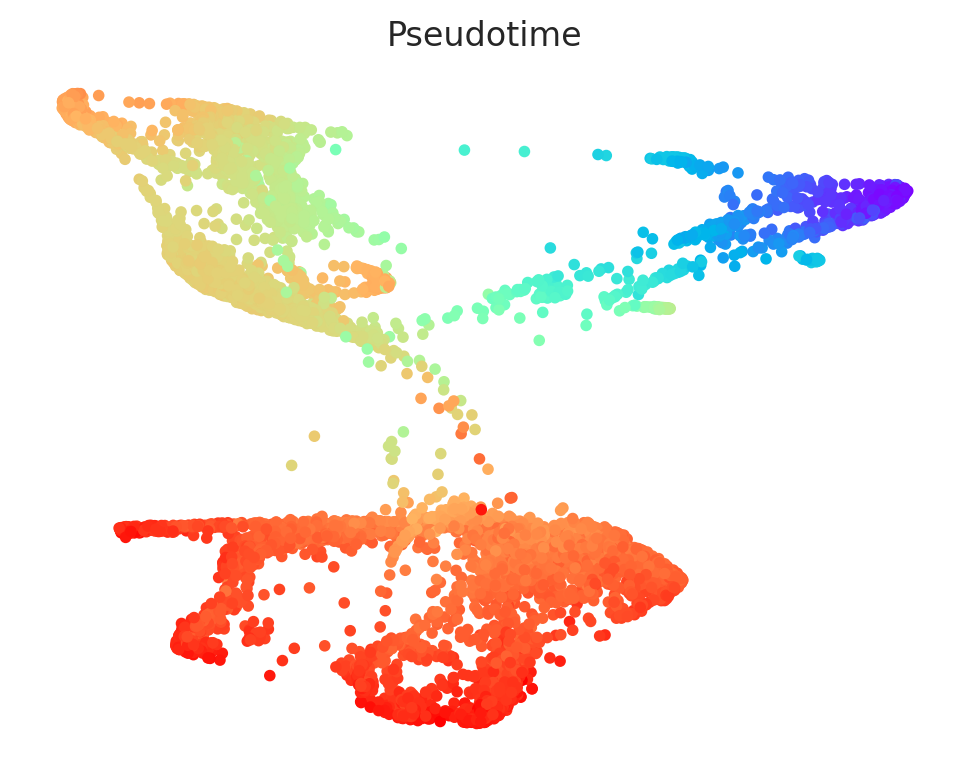

In [52]:
# Calculate pseudotime
pt.get_pseudotime_per_each_lineage()

# Check results
pt.plot_pseudotime(cmap="rainbow")



In [53]:
oracle.adata.obs = pt.adata.obs

In [54]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10,
                              use_cluster_specific_TFdict=True)

  0%|          | 0/11 [00:00<?, ?it/s]

In [55]:
oracle.to_hdf5("/mnt/c/users/UVictor/Documents/CellOracle/Shim22/\W.celloracle.oracle")